In [1]:
import torch
import torchvision
from torch import nn
import os
import matplotlib.pyplot as plt
from torchvision import transforms
from torchinfo import summary
import random

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [3]:
image_path = "/kaggle/input/pizza-steak-sushi/"
train_dir = os.path.join(image_path, "train")
test_dir = os.path.join(image_path, "test")

print(train_dir, test_dir)

/kaggle/input/pizza-steak-sushi/train /kaggle/input/pizza-steak-sushi/test


# visualize images from train data

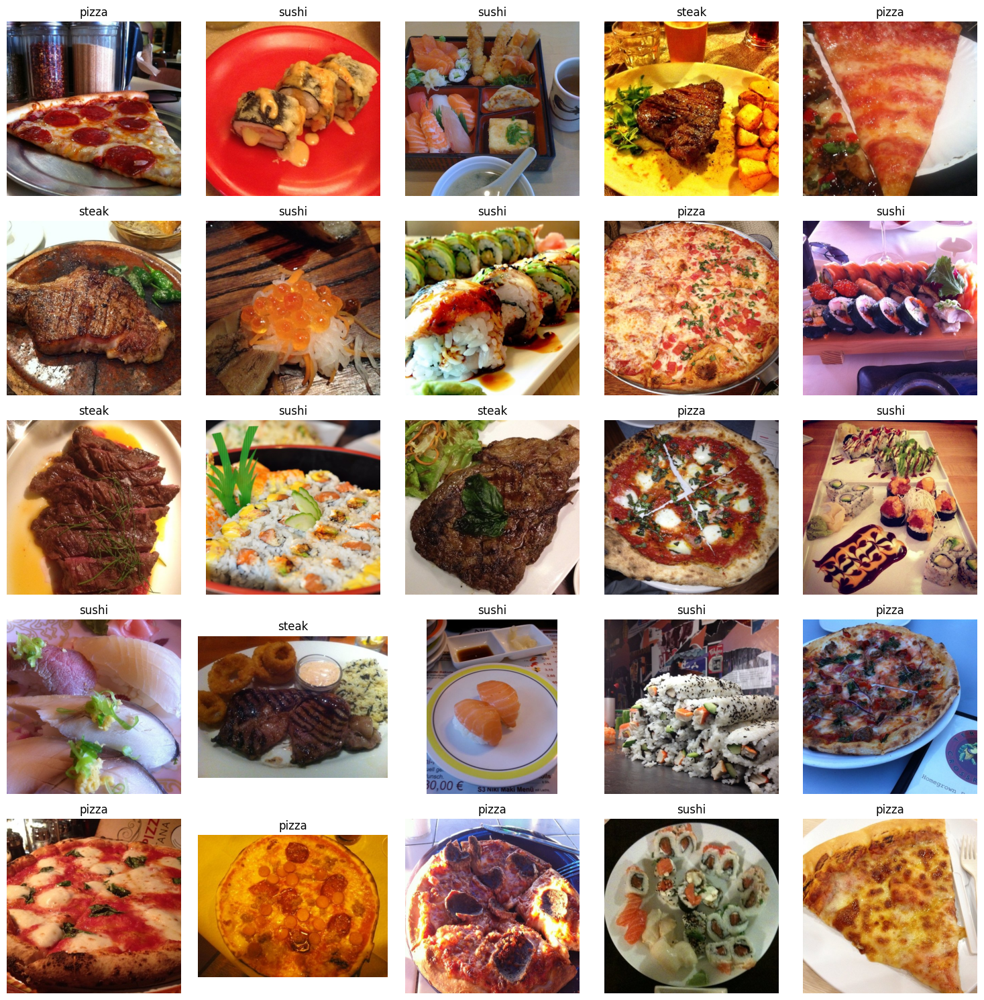

In [4]:
from PIL import Image
classes = os.listdir(train_dir)
image_paths = []
labels = []

for label in classes:
    class_dir = os.path.join(train_dir, label)
    for img_name in os.listdir(class_dir):
        image_paths.append(os.path.join(class_dir, img_name))
        labels.append(label)

sample_indices = random.sample(range(len(image_paths)), 25)
sample_images = [image_paths[i] for i in sample_indices]
sample_labels = [labels[i] for i in sample_indices]

fig, axes = plt.subplots(5, 5, figsize=(15, 15))
axes = axes.flatten()

for img_path, ax, label in zip(sample_images, axes, sample_labels):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(label)
    ax.axis('off')

plt.tight_layout()
plt.show()

# visualize Images from test data

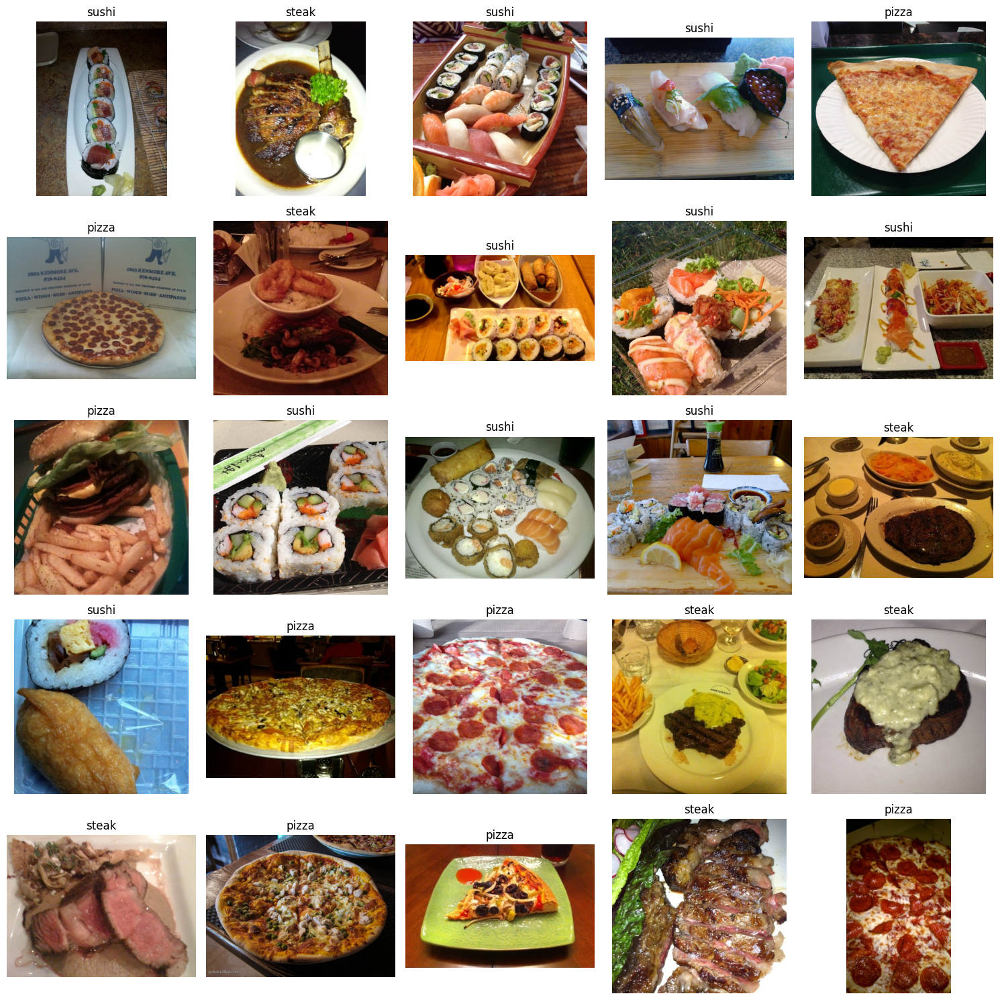

In [5]:
classes = os.listdir(test_dir)
image_paths = []
labels = []

for label in classes:
    class_dir = os.path.join(test_dir, label)
    for img_name in os.listdir(class_dir):
        image_paths.append(os.path.join(class_dir, img_name))
        labels.append(label)

sample_indices = random.sample(range(len(image_paths)), 25)
sample_images = [image_paths[i] for i in sample_indices]
sample_labels = [labels[i] for i in sample_indices]

fig, axes = plt.subplots(5, 5, figsize=(15, 15))
axes = axes.flatten()

for img_path, ax, label in zip(sample_images, axes, sample_labels):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(label)
    ax.axis('off')

plt.tight_layout()
plt.show()


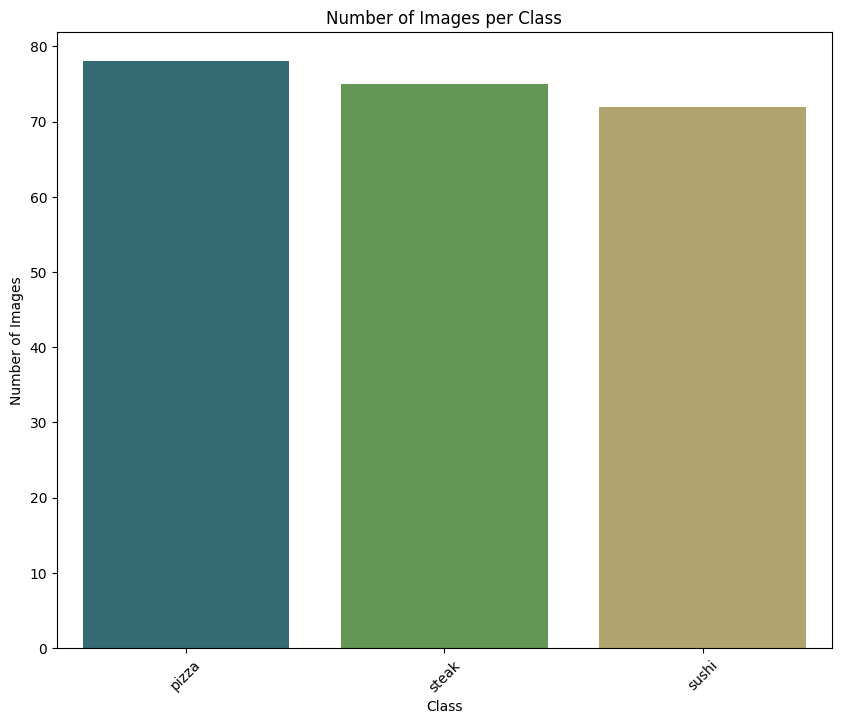

In [6]:
import seaborn as sns
import pandas as pd
new_path="/kaggle/input/pizza-steak-sushi/train/"
class_names = ['pizza', 'steak', 'sushi']  
data = {}
for class_name in class_names:
    class_dir = os.path.join(new_path, class_name)
    data[class_name] = len(os.listdir(class_dir))

df = pd.DataFrame(list(data.items()), columns=['Class', 'Count'])

plt.figure(figsize=(10,8))
sns.barplot(data=df, x='Class', y='Count', palette='gist_earth')
plt.title('Number of Images per Class')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.xticks(rotation=45)
plt.show()


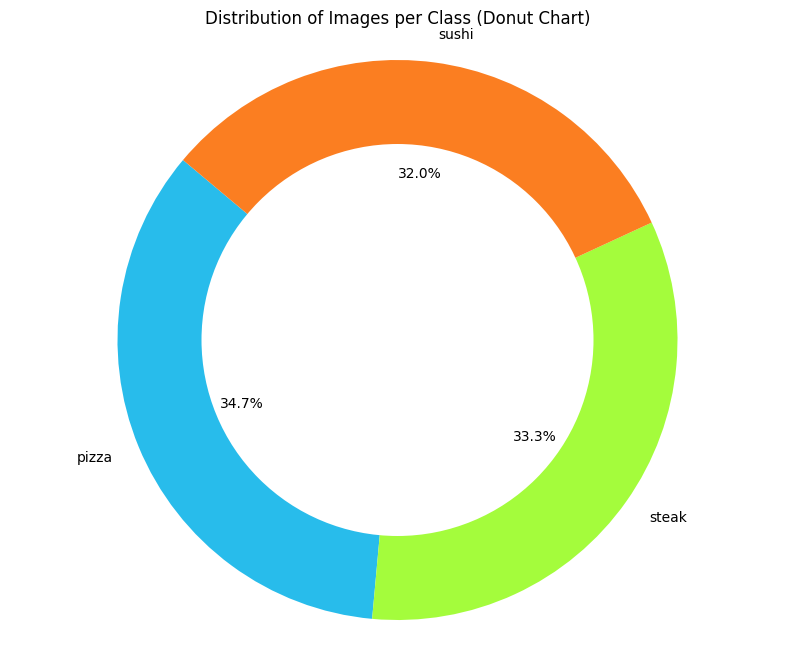

In [7]:
data = {}
for class_name in class_names:
    class_dir = os.path.join(new_path, class_name)
    data[class_name] = len(os.listdir(class_dir))

df = pd.DataFrame(list(data.items()), columns=['Class', 'Count'])

plt.figure(figsize=(10,8))
plt.pie(df['Count'], labels=df['Class'], autopct='%1.1f%%', startangle=140, colors=sns.color_palette("turbo", len(class_names)))
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.title('Distribution of Images per Class (Donut Chart)')
plt.show()


# transform Images

In [8]:
data_transform=transforms.Compose([transforms.Resize(size=(224,224)),transforms.RandomHorizontalFlip(p=0.5),
                                 transforms.ToTensor()])


In [9]:
from pathlib import Path


image_path = Path("/kaggle/input/pizza-steak-sushi/")

# Get list of image paths
image_path_list = list(image_path.glob("*/*/*.jpg"))

# transform Images

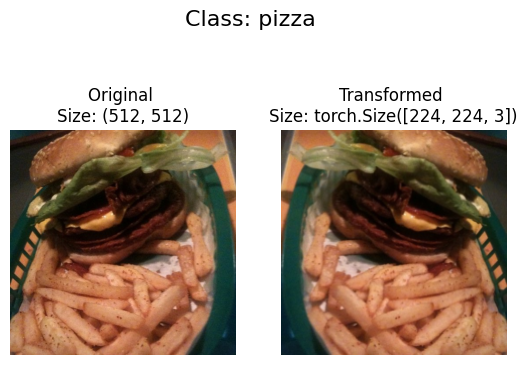

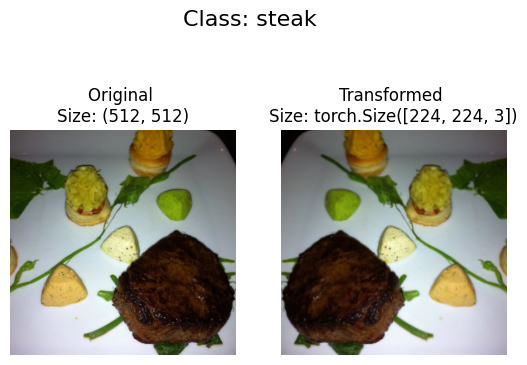

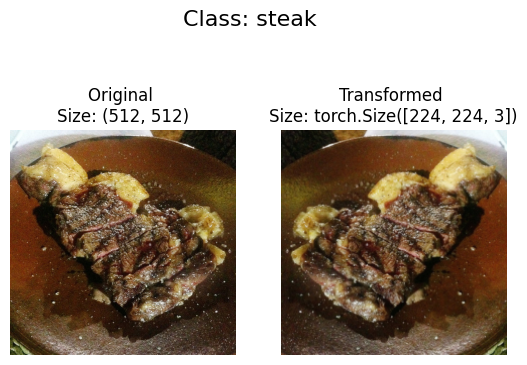

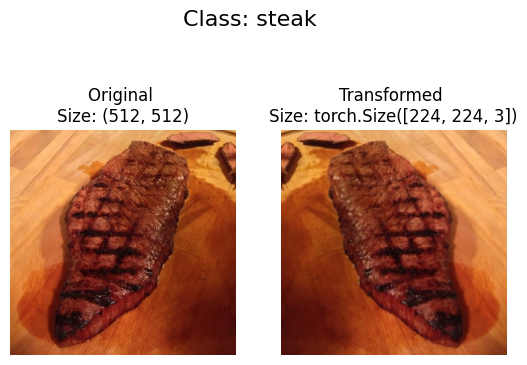

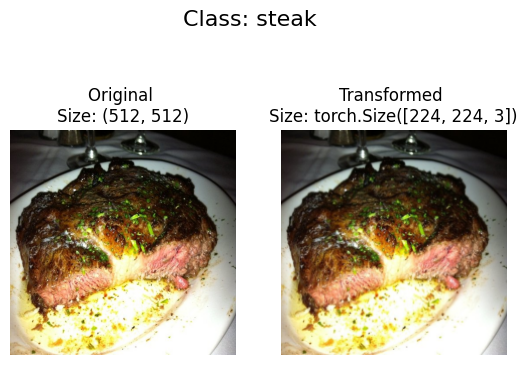

In [10]:
def plot_transformed_images(image_paths, transform, n=5, seed=42):
    random.seed(seed)
    random_image_paths = random.sample(image_paths, k=n)
    for image_path in random_image_paths:
        with Image.open(image_path) as f:
            fig, ax = plt.subplots(1, 2)
            ax[0].imshow(f)
            ax[0].set_title(f"Original \nSize: {f.size}")
            ax[0].axis("off")

            transformed_image = transform(f).permute(1, 2, 0)
            ax[1].imshow(transformed_image)
            ax[1].set_title(f"Transformed \nSize: {transformed_image.shape}")
            ax[1].axis("off")

            fig.suptitle(f"Class: {image_path.parent.stem}", fontsize=16)

plot_transformed_images(image_path_list, transform=data_transform, n=5)

# Use ImageFolder to create dataset(s)

In [11]:
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
train_data = datasets.ImageFolder(root=train_dir, transform=data_transform, target_transform=None)
test_data = datasets.ImageFolder(root=test_dir, transform=data_transform)

print(f"Train data:\n{train_data}\nTest data:\n{test_data}")

Train data:
Dataset ImageFolder
    Number of datapoints: 225
    Root location: /kaggle/input/pizza-steak-sushi/train
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
           )
Test data:
Dataset ImageFolder
    Number of datapoints: 75
    Root location: /kaggle/input/pizza-steak-sushi/test
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
           )


In [12]:
class_names = train_data.classes
class_names

['pizza', 'steak', 'sushi']

In [13]:
class_dict = train_data.class_to_idx
class_dict

{'pizza': 0, 'steak': 1, 'sushi': 2}

In [14]:
len(train_data), len(test_data)

(225, 75)

In [15]:
img, label = train_data[0][0], train_data[0][1]
print(f"Image tensor:\n{img}")
print(f"Image shape: {img.shape}")
print(f"Image datatype: {img.dtype}")
print(f"Image label: {label}")
print(f"Label datatype: {type(label)}")

Image tensor:
tensor([[[0.1098, 0.1098, 0.1098,  ..., 0.1255, 0.1176, 0.1137],
         [0.1137, 0.1176, 0.1176,  ..., 0.1137, 0.1137, 0.1176],
         [0.1216, 0.1255, 0.1216,  ..., 0.1098, 0.1176, 0.1137],
         ...,
         [0.1804, 0.1725, 0.1725,  ..., 0.0863, 0.0902, 0.0941],
         [0.1686, 0.1686, 0.1647,  ..., 0.0902, 0.0902, 0.0902],
         [0.1529, 0.1529, 0.1490,  ..., 0.0824, 0.0863, 0.0863]],

        [[0.0549, 0.0549, 0.0549,  ..., 0.0824, 0.0745, 0.0706],
         [0.0588, 0.0627, 0.0627,  ..., 0.0706, 0.0706, 0.0745],
         [0.0627, 0.0667, 0.0627,  ..., 0.0667, 0.0784, 0.0706],
         ...,
         [0.2314, 0.2314, 0.2353,  ..., 0.1020, 0.1059, 0.1098],
         [0.2314, 0.2314, 0.2275,  ..., 0.1059, 0.1059, 0.1059],
         [0.2235, 0.2235, 0.2196,  ..., 0.0980, 0.1020, 0.1020]],

        [[0.0196, 0.0196, 0.0196,  ..., 0.1059, 0.0980, 0.0941],
         [0.0196, 0.0235, 0.0235,  ..., 0.0941, 0.0941, 0.0980],
         [0.0196, 0.0235, 0.0235,  ..., 0.09

# Turn train and test Datasets into DataLoaders

In [16]:
train_dataloader = DataLoader(dataset=train_data, 
                              batch_size=8, # how many samples per batch?
                              num_workers=1, # how many subprocesses to use for data loading? (higher = more)
                              shuffle=True) # shuffle the data?

test_dataloader = DataLoader(dataset=test_data, 
                             batch_size=8, 
                             num_workers=1, 
                             shuffle=False) # don't usually need to shuffle testing data

train_dataloader, test_dataloader

(<torch.utils.data.dataloader.DataLoader at 0x78be1862f8e0>,
 <torch.utils.data.dataloader.DataLoader at 0x78be1862cac0>)

In [17]:
# 1. Setup pretrained EffNetB2 weights
effnetb2_weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT

# 2. Get EffNetB2 transforms
effnetb2_transforms = effnetb2_weights.transforms()

# 3. Setup pretrained model
effnetb2 = torchvision.models.efficientnet_b2(weights=effnetb2_weights) # could also use weights="DEFAULT"

# 4. Freeze the base layers in the model (this will freeze all layers to begin with)
for param in effnetb2.parameters():
    param.requires_grad = False

Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth
100%|██████████| 35.2M/35.2M [00:00<00:00, 149MB/s] 


In [18]:
effnetb2.classifier

Sequential(
  (0): Dropout(p=0.3, inplace=True)
  (1): Linear(in_features=1408, out_features=1000, bias=True)
)

In [19]:
effnetb2.classifier = nn.Sequential(
    nn.Dropout(p=0.3, inplace=True),  # keep dropout layer same
    nn.Linear(in_features=1408, out_features=3)  # keep in_features same 
)
summary(effnetb2, 
        input_size=(1, 3, 224, 224),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [1, 3, 224, 224]     [1, 3]               --                   Partial
├─Sequential (features)                                      [1, 3, 224, 224]     [1, 1408, 7, 7]      --                   False
│    └─Conv2dNormActivation (0)                              [1, 3, 224, 224]     [1, 32, 112, 112]    --                   False
│    │    └─Conv2d (0)                                       [1, 3, 224, 224]     [1, 32, 112, 112]    (864)                False
│    │    └─BatchNorm2d (1)                                  [1, 32, 112, 112]    [1, 32, 112, 112]    (64)                 False
│    │    └─SiLU (2)                                         [1, 32, 112, 112]    [1, 32, 112, 112]    --                   --
│    └─Sequential (1)                                        [1, 32, 112, 112]    [1, 1

# Create train & test loop functions

In [20]:
def train_step(model: torch.nn.Module, 
               dataloader: torch.utils.data.DataLoader, 
               loss_fn: torch.nn.Module, 
               optimizer: torch.optim.Optimizer):
    # Put model in train mode
    model.train()
    
    # Setup train loss and train accuracy values
    train_loss, train_acc = 0, 0
    
    # Loop through data loader data batches
    for batch, (X, y) in enumerate(dataloader):
        # Send data to target device
        X, y = X.to(device), y.to(device)

        # 1. Forward pass
        y_pred = model(X)

        # 2. Calculate  and accumulate loss
        loss = loss_fn(y_pred, y)
        train_loss += loss.item() 

        # 3. Optimizer zero grad
        optimizer.zero_grad()

        # 4. Loss backward
        loss.backward()

        # 5. Optimizer step
        optimizer.step()

        # Calculate and accumulate accuracy metrics across all batches
        y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
        train_acc += (y_pred_class == y).sum().item()/len(y_pred)

    # Adjust metrics to get average loss and accuracy per batch 
    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)
    return train_loss, train_acc

In [21]:
def test_step(model: torch.nn.Module, 
              dataloader: torch.utils.data.DataLoader, 
              loss_fn: torch.nn.Module):
    # Put model in eval mode
    model.eval() 
    
    # Setup test loss and test accuracy values
    test_loss, test_acc = 0, 0
    
    # Turn on inference context manager
    with torch.inference_mode():
        # Loop through DataLoader batches
        for batch, (X, y) in enumerate(dataloader):
            # Send data to target device
            X, y = X.to(device), y.to(device)
    
            # 1. Forward pass
            test_pred_logits = model(X)

            # 2. Calculate and accumulate loss
            loss = loss_fn(test_pred_logits, y)
            test_loss += loss.item()
            
            # Calculate and accumulate accuracy
            test_pred_labels = test_pred_logits.argmax(dim=1)
            test_acc += ((test_pred_labels == y).sum().item()/len(test_pred_labels))
            
    # Adjust metrics to get average loss and accuracy per batch 
    test_loss = test_loss / len(dataloader)
    test_acc = test_acc / len(dataloader)
    return test_loss, test_acc

In [22]:
from tqdm.auto import tqdm

# 1. Take in various parameters required for training and test steps
def train(model: torch.nn.Module, 
          train_dataloader: torch.utils.data.DataLoader, 
          test_dataloader: torch.utils.data.DataLoader, 
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module = nn.CrossEntropyLoss(),
          epochs: int = 5):
    
    # 2. Create empty results dictionary
    results = {"train_loss": [],
        "train_acc": [],
        "test_loss": [],
        "test_acc": []
    }
    
    # 3. Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                           dataloader=train_dataloader,
                                           loss_fn=loss_fn,
                                           optimizer=optimizer)
        test_loss, test_acc = test_step(model=model,
            dataloader=test_dataloader,
            loss_fn=loss_fn)
        
        # 4. Print out what's happening
        print(
            f"Epoch: {epoch+1} | "
            f"train_loss: {train_loss:.4f} | "
            f"train_acc: {train_acc:.4f} | "
            f"test_loss: {test_loss:.4f} | "
            f"test_acc: {test_acc:.4f}"
        )

        # 5. Update results dictionary
        # Ensure all data is moved to CPU and converted to float for storage
        results["train_loss"].append(train_loss.item() if isinstance(train_loss, torch.Tensor) else train_loss)
        results["train_acc"].append(train_acc.item() if isinstance(train_acc, torch.Tensor) else train_acc)
        results["test_loss"].append(test_loss.item() if isinstance(test_loss, torch.Tensor) else test_loss)
        results["test_acc"].append(test_acc.item() if isinstance(test_acc, torch.Tensor) else test_acc)

    # 6. Return the filled results at the end of the epochs
    return results

In [23]:
# Set random seeds
torch.manual_seed(42) 
torch.cuda.manual_seed(42)

# Set number of epochs
NUM_EPOCHS = 50



# Setup loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params=effnetb2.parameters(), lr=0.001)

# Start the timer
from timeit import default_timer as timer 
start_time = timer()

# Train model_0 
results_effnetb2 = train(model=effnetb2, 
                        train_dataloader=train_dataloader,
                        test_dataloader=test_dataloader,
                        optimizer=optimizer,
                        loss_fn=loss_fn, 
                        epochs=NUM_EPOCHS)

# End the timer and print out how long it took
end_time = timer()
print(f"Total training time: {end_time-start_time:.3f} seconds")

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0360 | train_acc: 0.4569 | test_loss: 0.8715 | test_acc: 0.7750
Epoch: 2 | train_loss: 0.7514 | train_acc: 0.7672 | test_loss: 0.7133 | test_acc: 0.8875
Epoch: 3 | train_loss: 0.6346 | train_acc: 0.8103 | test_loss: 0.6182 | test_acc: 0.8750
Epoch: 4 | train_loss: 0.5179 | train_acc: 0.8491 | test_loss: 0.5556 | test_acc: 0.9000
Epoch: 5 | train_loss: 0.4872 | train_acc: 0.8534 | test_loss: 0.5571 | test_acc: 0.9000
Epoch: 6 | train_loss: 0.4879 | train_acc: 0.8190 | test_loss: 0.4705 | test_acc: 0.9375
Epoch: 7 | train_loss: 0.4089 | train_acc: 0.8922 | test_loss: 0.4591 | test_acc: 0.9125
Epoch: 8 | train_loss: 0.3689 | train_acc: 0.8707 | test_loss: 0.4437 | test_acc: 0.9000
Epoch: 9 | train_loss: 0.3862 | train_acc: 0.8836 | test_loss: 0.4679 | test_acc: 0.9000
Epoch: 10 | train_loss: 0.4142 | train_acc: 0.8448 | test_loss: 0.4445 | test_acc: 0.9250
Epoch: 11 | train_loss: 0.3772 | train_acc: 0.8707 | test_loss: 0.4241 | test_acc: 0.9125
Epoch: 12 | train_l

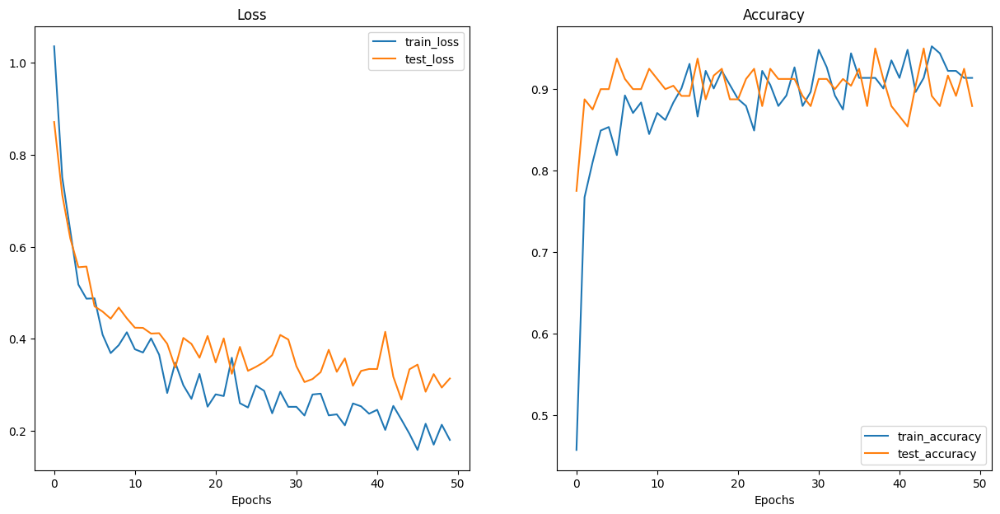

In [24]:
from typing import Dict, List
def plot_loss_curves(results: Dict[str, List[float]]):
    loss = results['train_loss']
    test_loss = results['test_loss']
    accuracy = results['train_acc']
    test_accuracy = results['test_acc']
    epochs = range(len(results['train_loss']))
    plt.figure(figsize=(15, 7))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, label='train_loss')
    plt.plot(epochs, test_loss, label='test_loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, label='train_accuracy')
    plt.plot(epochs, test_accuracy, label='test_accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.legend()
    plt.show()
    
plot_loss_curves(results_effnetb2)

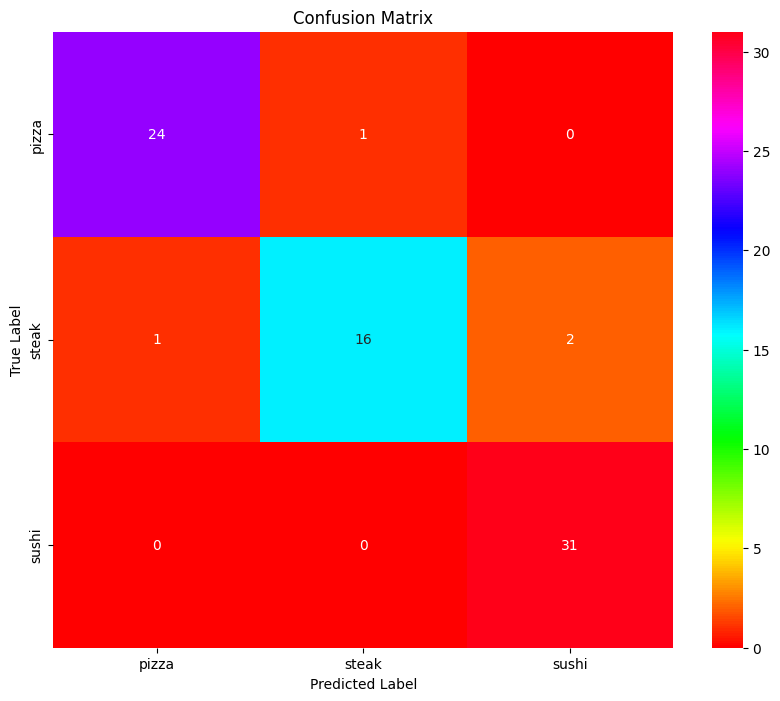

In [25]:
import seaborn as sns

from sklearn.metrics import confusion_matrix

# Set model to evaluation mode
effnetb2.eval()

all_labels = []
all_preds = []
all_outputs = []

# Turn on inference mode
with torch.no_grad():
    for X, y in test_dataloader:
        X, y = X.to(device), y.to(device)
        outputs = effnetb2(X)
        all_outputs.append(outputs.cpu().numpy())
        _, preds = torch.max(outputs, 1)

        all_labels.extend(y.cpu().numpy())
        all_preds.extend(preds.cpu().numpy())

# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Get class names from train data
class_names = train_data.classes

# Plot confusion matrix using seaborn heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap="hsv", xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


# Classification Report

In [26]:
from sklearn.metrics import classification_report
print(classification_report(all_labels,all_preds, target_names=class_names))

              precision    recall  f1-score   support

       pizza       0.96      0.96      0.96        25
       steak       0.94      0.84      0.89        19
       sushi       0.94      1.00      0.97        31

    accuracy                           0.95        75
   macro avg       0.95      0.93      0.94        75
weighted avg       0.95      0.95      0.95        75



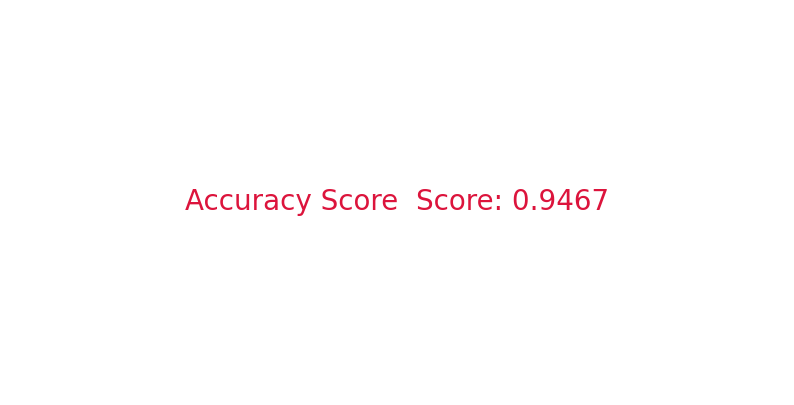

In [27]:
from sklearn.metrics import (
    accuracy_score,
    brier_score_loss,
    log_loss,
    matthews_corrcoef,
    roc_auc_score,
    cohen_kappa_score
)

plt.figure(figsize=(10,5),facecolor="white")
acc_score = accuracy_score(all_labels,all_preds)
plt.plot([])
plt.text(0,0, f'Accuracy Score  Score: {acc_score:.4f}', fontsize=20, ha='center', va='center',color="crimson")
plt.axis('off')

# Set the x-axis limits
plt.xlim(-1, 1)
plt.ylim(-1,1)

plt.show()

In [28]:
torch.save(effnetb2.state_dict(), 'effnetb2_model.pth')

# Creating a ViT feature extractor

In [29]:
weights = torchvision.models.ViT_B_16_Weights.DEFAULT
transforms = weights.transforms()
model = torchvision.models.vit_b_16(weights=weights)
# Freeze all layers in the model
# for param in model.parameters():
#     param.requires_grad = False

# Change classifier head to suit our needs (this will be trainable)
num_classes = 3  # Set this to your number of classes
model.heads = nn.Sequential(
    nn.Linear(in_features=768,  # Keep this the same as original model
               out_features=num_classes)
)


Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth
100%|██████████| 330M/330M [00:01<00:00, 212MB/s]  


In [30]:
model.to(device)

VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_a

In [31]:
train_data = datasets.ImageFolder(root=train_dir, transform=transforms, target_transform=None)
test_data = datasets.ImageFolder(root=test_dir, transform=transforms)

In [32]:
train_dataloader = DataLoader(dataset=train_data, 
                              batch_size=8, # how many samples per batch?
                              num_workers=1, # how many subprocesses to use for data loading? (higher = more)
                              shuffle=True) # shuffle the data?

test_dataloader = DataLoader(dataset=test_data, 
                             batch_size=8, 
                             num_workers=1, 
                             shuffle=False) # don't usually need to shuffle testing data


In [33]:
summary(model, 
        input_size=(1, 3, 224, 224),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
VisionTransformer (VisionTransformer)                        [1, 3, 224, 224]     [1, 3]               768                  True
├─Conv2d (conv_proj)                                         [1, 3, 224, 224]     [1, 768, 14, 14]     590,592              True
├─Encoder (encoder)                                          [1, 197, 768]        [1, 197, 768]        151,296              True
│    └─Dropout (dropout)                                     [1, 197, 768]        [1, 197, 768]        --                   --
│    └─Sequential (layers)                                   [1, 197, 768]        [1, 197, 768]        --                   True
│    │    └─EncoderBlock (encoder_layer_0)                   [1, 197, 768]        [1, 197, 768]        7,087,872            True
│    │    └─EncoderBlock (encoder_layer_1)                   [1, 197, 768]        [1, 197, 768

In [34]:
# Set random seeds
torch.manual_seed(42) 
torch.cuda.manual_seed(42)

# Set number of epochs
NUM_EPOCHS = 50



# Setup loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params=effnetb2.parameters(), lr=0.001)

# Start the timer
from timeit import default_timer as timer 
start_time = timer()

# Train model_0 
results = train(model=model, 
                        train_dataloader=train_dataloader,
                        test_dataloader=test_dataloader,
                        optimizer=optimizer,
                        loss_fn=loss_fn, 
                        epochs=NUM_EPOCHS)

# End the timer and print out how long it took
end_time = timer()
print(f"Total training time: {end_time-start_time:.3f} seconds")

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.2342 | train_acc: 0.1595 | test_loss: 1.2754 | test_acc: 0.1333
Epoch: 2 | train_loss: 1.2383 | train_acc: 0.1595 | test_loss: 1.2754 | test_acc: 0.1333
Epoch: 3 | train_loss: 1.2437 | train_acc: 0.1595 | test_loss: 1.2754 | test_acc: 0.1333
Epoch: 4 | train_loss: 1.2440 | train_acc: 0.1595 | test_loss: 1.2754 | test_acc: 0.1333
Epoch: 5 | train_loss: 1.2378 | train_acc: 0.1595 | test_loss: 1.2754 | test_acc: 0.1333
Epoch: 6 | train_loss: 1.2333 | train_acc: 0.1595 | test_loss: 1.2754 | test_acc: 0.1333
Epoch: 7 | train_loss: 1.2580 | train_acc: 0.1595 | test_loss: 1.2754 | test_acc: 0.1333
Epoch: 8 | train_loss: 1.2442 | train_acc: 0.1595 | test_loss: 1.2754 | test_acc: 0.1333
Epoch: 9 | train_loss: 1.2354 | train_acc: 0.1595 | test_loss: 1.2754 | test_acc: 0.1333
Epoch: 10 | train_loss: 1.2353 | train_acc: 0.1595 | test_loss: 1.2754 | test_acc: 0.1333
Epoch: 11 | train_loss: 1.2328 | train_acc: 0.1897 | test_loss: 1.2754 | test_acc: 0.1333
Epoch: 12 | train_l

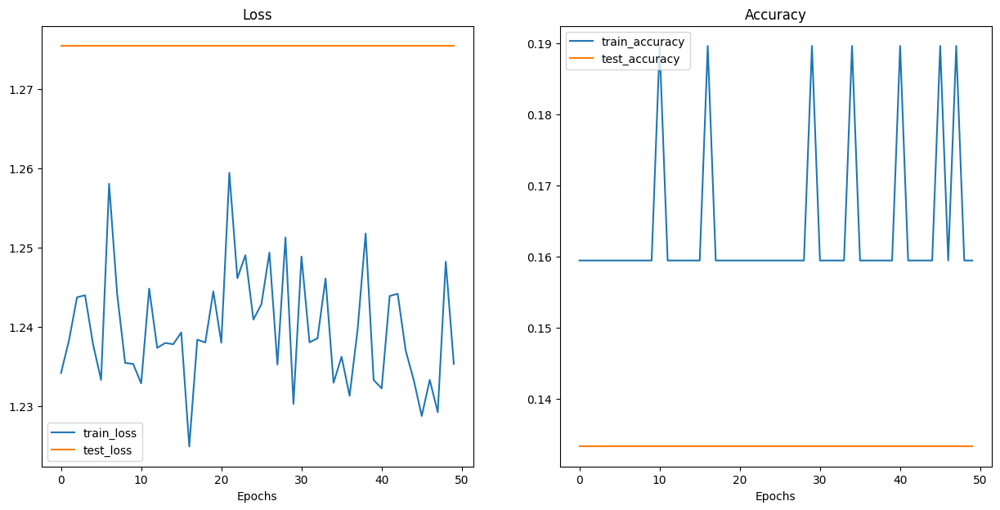

In [35]:
def plot_loss_curves(results: Dict[str, List[float]]):
    loss = results['train_loss']
    test_loss = results['test_loss']
    accuracy = results['train_acc']
    test_accuracy = results['test_acc']
    epochs = range(len(results['train_loss']))
    plt.figure(figsize=(15, 7))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, label='train_loss')
    plt.plot(epochs, test_loss, label='test_loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, label='train_accuracy')
    plt.plot(epochs, test_accuracy, label='test_accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.legend()
    plt.show()
    
plot_loss_curves(results)

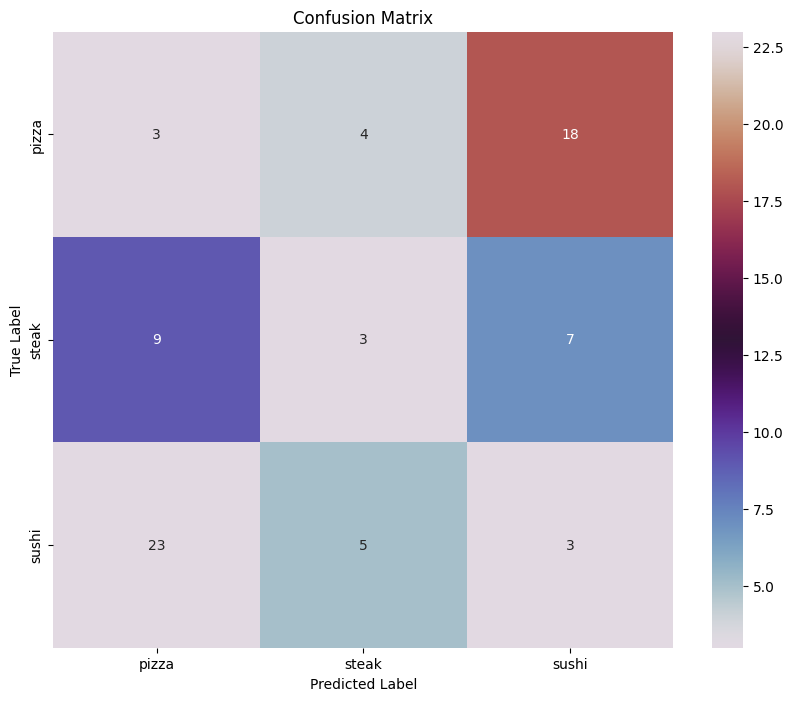

In [36]:
model.eval()

all_labels = []
all_preds = []
all_outputs = []

# Turn on inference mode
with torch.no_grad():
    for X, y in test_dataloader:
        X, y = X.to(device), y.to(device)
        outputs = model(X)
        all_outputs.append(outputs.cpu().numpy())
        _, preds = torch.max(outputs, 1)

        all_labels.extend(y.cpu().numpy())
        all_preds.extend(preds.cpu().numpy())

# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Get class names from train data
class_names = train_data.classes

# Plot confusion matrix using seaborn heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap="twilight", xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


# Classification Report

In [37]:
from sklearn.metrics import classification_report
print(classification_report(all_labels,all_preds, target_names=class_names))

              precision    recall  f1-score   support

       pizza       0.09      0.12      0.10        25
       steak       0.25      0.16      0.19        19
       sushi       0.11      0.10      0.10        31

    accuracy                           0.12        75
   macro avg       0.15      0.12      0.13        75
weighted avg       0.14      0.12      0.12        75



# Vit_Accuracy Score

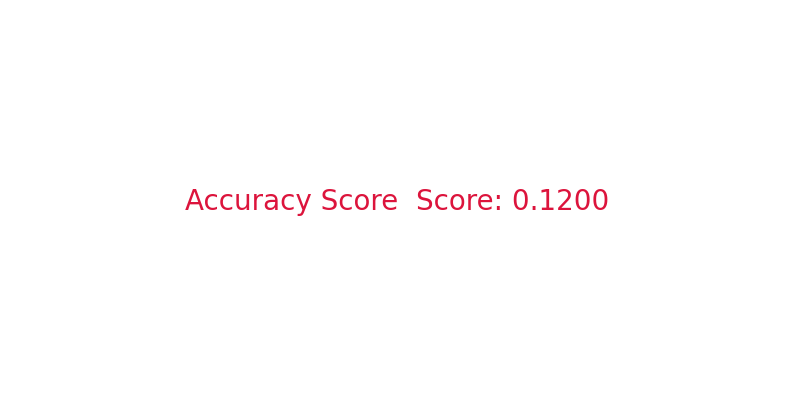

In [38]:
from sklearn.metrics import (
    accuracy_score,
    brier_score_loss,
    log_loss,
    matthews_corrcoef,
    roc_auc_score,
    cohen_kappa_score
)

plt.figure(figsize=(10,5),facecolor="white")
acc_score_2 = accuracy_score(all_labels,all_preds)
plt.plot([])
plt.text(0,0, f'Accuracy Score  Score: {acc_score_2:.4f}', fontsize=20, ha='center', va='center',color="crimson")
plt.axis('off')

# Set the x-axis limits
plt.xlim(-1, 1)
plt.ylim(-1,1)

plt.show()


In [39]:
torch.save(model.state_dict(), 'vit_model.pth')

# Creating a function to make predictions across the test dataset

In [40]:
import pathlib
def pred_and_store(paths: List[pathlib.Path], 
                   model: torch.nn.Module,
                   transform: torchvision.transforms, 
                   class_names: List[str], 
                   device: str = "cuda" if torch.cuda.is_available() else "cpu") -> List[Dict]:
    
    # 2. Create an empty list to store prediction dictionaries
    pred_list = []
    
    # 3. Loop through target paths
    for path in tqdm(paths):
        
        # 4. Create empty dictionary to store prediction information for each sample
        pred_dict = {}

        # 5. Get the sample path and ground truth class name
        pred_dict["image_path"] = path
        class_name = path.parent.stem
        pred_dict["class_name"] = class_name
        
        # 6. Start the prediction timer
        start_time = timer()
        
        # 7. Open image path
        img = Image.open(path)
        
        # 8. Transform the image, add batch dimension and put image on target device
        transformed_image = transform(img).unsqueeze(0).to(device) 
        
        # 9. Prepare model for inference by sending it to target device and turning on eval() mode
        model.to(device)
        model.eval()
        
        # 10. Get prediction probability, predicition label and prediction class
        with torch.inference_mode():
            pred_logit = model(transformed_image) # perform inference on target sample 
            pred_prob = torch.softmax(pred_logit, dim=1) # turn logits into prediction probabilities
            pred_label = torch.argmax(pred_prob, dim=1) # turn prediction probabilities into prediction label
            pred_class = class_names[pred_label.cpu()] # hardcode prediction class to be on CPU

            # 11. Make sure things in the dictionary are on CPU (required for inspecting predictions later on) 
            pred_dict["pred_prob"] = round(pred_prob.unsqueeze(0).max().cpu().item(), 4)
            pred_dict["pred_class"] = pred_class
            
            # 12. End the timer and calculate time per pred
            end_time = timer()
            pred_dict["time_for_pred"] = round(end_time-start_time, 4)

        # 13. Does the pred match the true label?
        pred_dict["correct"] = class_name == pred_class

        # 14. Add the dictionary to the list of preds
        pred_list.append(pred_dict)
    
    # 15. Return list of prediction dictionaries
    return pred_list

In [41]:
test_data_paths = list(Path(test_dir).glob("*/*.jpg"))
test_data_paths[:5]

[PosixPath('/kaggle/input/pizza-steak-sushi/test/steak/1627703.jpg'),
 PosixPath('/kaggle/input/pizza-steak-sushi/test/steak/296375.jpg'),
 PosixPath('/kaggle/input/pizza-steak-sushi/test/steak/1285886.jpg'),
 PosixPath('/kaggle/input/pizza-steak-sushi/test/steak/2117351.jpg'),
 PosixPath('/kaggle/input/pizza-steak-sushi/test/steak/966174.jpg')]

In [42]:
effnetb2_test_pred_dicts = pred_and_store(paths=test_data_paths,
                                          model=effnetb2,
                                          transform=effnetb2_transforms,
                                          class_names=class_names,
                                          device=device)

  0%|          | 0/75 [00:00<?, ?it/s]

In [43]:
effnetb2_test_pred_df = pd.DataFrame(effnetb2_test_pred_dicts)
effnetb2_test_pred_df.head()

,image_path,class_name,pred_prob,pred_class,time_for_pred,correct
0,/kaggle/input/pizza-steak-sushi/test/steak/162...,steak,1.0,steak,0.0730,True
1,/kaggle/input/pizza-steak-sushi/test/steak/296...,steak,1.0,pizza,0.0454,False
2,/kaggle/input/pizza-steak-sushi/test/steak/128...,steak,1.0,sushi,0.0408,False
3,/kaggle/input/pizza-steak-sushi/test/steak/211...,steak,1.0,steak,0.0656,True
4,/kaggle/input/pizza-steak-sushi/test/steak/966...,steak,1.0,pizza,0.0360,False


In [44]:
effnetb2_test_pred_df.correct.value_counts()

correct
False    51
True     24
Name: count, dtype: int64

#  predictions with ViT

In [45]:
vit_test_pred_dicts = pred_and_store(paths=test_data_paths,
                                     model=model,
                                     transform=transforms,
                                     class_names=class_names,
                                     device=device)

  0%|          | 0/75 [00:00<?, ?it/s]

In [46]:
vit_test_pred_df = pd.DataFrame(vit_test_pred_dicts)
vit_test_pred_df.head()

,image_path,class_name,pred_prob,pred_class,time_for_pred,correct
0,/kaggle/input/pizza-steak-sushi/test/steak/162...,steak,0.4540,steak,0.0351,True
1,/kaggle/input/pizza-steak-sushi/test/steak/296...,steak,0.5150,sushi,0.0208,False
2,/kaggle/input/pizza-steak-sushi/test/steak/128...,steak,0.4200,pizza,0.0211,False
3,/kaggle/input/pizza-steak-sushi/test/steak/211...,steak,0.4200,pizza,0.0207,False
4,/kaggle/input/pizza-steak-sushi/test/steak/966...,steak,0.5253,pizza,0.0244,False


In [47]:
# Count the number of correct predictions
vit_test_pred_df.correct.value_counts()

correct
False    66
True      9
Name: count, dtype: int64

In [48]:
# Calculate average time per prediction for ViT model
vit_average_time_per_pred = round(vit_test_pred_df.time_for_pred.mean(), 4)
print(f"ViT average time per prediction: {vit_average_time_per_pred} seconds")

ViT average time per prediction: 0.0243 seconds


In [49]:
vit_total_params = sum(torch.numel(param) for param in model.parameters())
vit_total_params

85800963

In [50]:
from pathlib import Path

# Get the model size in bytes then convert to megabytes
pretrained_vit_model_size = Path("vit_model.pth").stat().st_size // (1024*1024) # division converts bytes to megabytes (roughly) 
print(f"Pretrained ViT feature extractor model size: {pretrained_vit_model_size} MB")

Pretrained ViT feature extractor model size: 327 MB


In [51]:
vit_stats = {"test_loss": results["test_loss"][-1],
             "test_acc": results["test_acc"][-1],
             "number_of_parameters": vit_total_params,
             "model_size (MB)": pretrained_vit_model_size}

vit_stats

{'test_loss': 1.2754242777824403,
 'test_acc': 0.13333333333333333,
 'number_of_parameters': 85800963,
 'model_size (MB)': 327}

In [52]:
# Add average prediction time for ViT model on CPU
vit_stats["time_per_pred_cpu"] = vit_average_time_per_pred
vit_stats

{'test_loss': 1.2754242777824403,
 'test_acc': 0.13333333333333333,
 'number_of_parameters': 85800963,
 'model_size (MB)': 327,
 'time_per_pred_cpu': 0.0243}

# Checking the size of EffNetB2 feature extractor

In [53]:
pretrained_effnetb2_model_size = Path("effnetb2_model.pth").stat().st_size // (1024*1024) # division converts bytes to megabytes (roughly) 
print(f"Pretrained EffNetB2 feature extractor model size: {pretrained_effnetb2_model_size} MB")

Pretrained EffNetB2 feature extractor model size: 29 MB


In [54]:
# Count number of parameters in EffNetB2
effnetb2_total_params = sum(torch.numel(param) for param in effnetb2.parameters())
effnetb2_total_params

7705221

In [55]:
effnetb2_stats = {"test_loss": results_effnetb2["test_loss"][-1],
                  "test_acc": results_effnetb2["test_acc"][-1],
                  "number_of_parameters": effnetb2_total_params,
                  "model_size (MB)": pretrained_effnetb2_model_size}
effnetb2_stats

{'test_loss': 0.31369741782546046,
 'test_acc': 0.8791666666666667,
 'number_of_parameters': 7705221,
 'model_size (MB)': 29}

In [56]:
# Find the average time per prediction 
effnetb2_average_time_per_pred = round(effnetb2_test_pred_df.time_for_pred.mean(), 4)
print(f"EffNetB2 average time per prediction: {effnetb2_average_time_per_pred} seconds")

EffNetB2 average time per prediction: 0.0398 seconds


In [57]:
effnetb2_stats["time_per_pred_cpu"]=effnetb2_average_time_per_pred
effnetb2_stats

{'test_loss': 0.31369741782546046,
 'test_acc': 0.8791666666666667,
 'number_of_parameters': 7705221,
 'model_size (MB)': 29,
 'time_per_pred_cpu': 0.0398}

In [58]:
# Turn stat dictionaries into DataFrame
df = pd.DataFrame([effnetb2_stats, vit_stats])

# Add column for model names
df["model"] = ["EffNetB2", "ViT"]

# Convert accuracy to percentages
df["test_acc"] = round(df["test_acc"] * 100, 2)

df

,test_loss,test_acc,number_of_parameters,model_size (MB),time_per_pred_cpu,model
0,0.313697,87.92,7705221,29,0.0398,EffNetB2
1,1.275424,13.33,85800963,327,0.0243,ViT


# Visualizing the speed vs. performance tradeoff

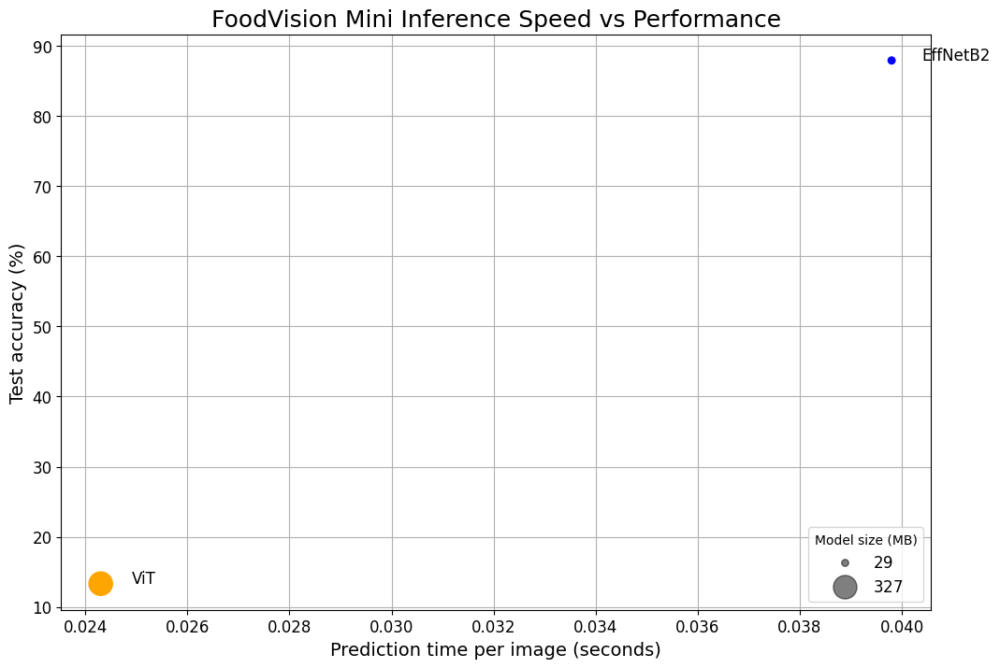

In [59]:
# 1. Create a plot from model comparison DataFrame
fig, ax = plt.subplots(figsize=(12, 8))
scatter = ax.scatter(data=df, 
                     x="time_per_pred_cpu", 
                     y="test_acc", 
                     c=["blue", "orange"], # what colours to use?
                     s="model_size (MB)") # size the dots by the model sizes

# 2. Add titles, labels and customize fontsize for aesthetics
ax.set_title("FoodVision Mini Inference Speed vs Performance", fontsize=18)
ax.set_xlabel("Prediction time per image (seconds)", fontsize=14)
ax.set_ylabel("Test accuracy (%)", fontsize=14)
ax.tick_params(axis='both', labelsize=12)
ax.grid(True)

# 3. Annotate with model names
for index, row in df.iterrows():
    ax.annotate(text=row["model"], # note: depending on your version of Matplotlib, you may need to use "s=..." or "text=...", see: https://github.com/faustomorales/keras-ocr/issues/183#issuecomment-977733270 
                xy=(row["time_per_pred_cpu"]+0.0006, row["test_acc"]+0.03),
                size=12)

# 4. Create a legend based on model sizes
handles, labels = scatter.legend_elements(prop="sizes", alpha=0.5)
model_size_legend = ax.legend(handles, 
                              labels, 
                              loc="lower right", 
                              title="Model size (MB)",
                              fontsize=12)


plt.savefig("09-foodvision-mini-inference-speed-vs-performance.jpg")

# Show the figure
plt.show()

In [60]:
 ! pip install gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.1/18.1 MB 69.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.7/318.7 kB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 91.4 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.3/126.3 kB 8.3 MB/s eta 0:00:00
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.26.18
    Uninstalling urllib3-1.26.18:
      Successfully uninstalled urllib3-1.26.18
  Attempting uninstall: tomlkit
    Found existing installation: tomlkit 0.13.2
    Uninstalling tomlkit-0.13.2:
      Successfully uninstalled tomlkit-0.13.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
distributed 2024.7.1 requires dask==2024.7.1, but you have dask 2024.9.1 which is incompatible.
kfp 2.5.0 requires google-cloud-storage<3,>=2.2.1, but you have goog

In [61]:
import gradio as gr
effnetb2.to(device) 

# Check the device
next(iter(effnetb2.parameters())).device

device(type='cuda', index=0)

In [67]:
from typing import Tuple, Dict

def predict(img) -> Tuple[Dict, float]:
    """Transforms and performs a prediction on img and returns prediction and time taken."""
    
    # Start the timer
    start_time = timer()
    
    try:
        # Transform the image and add a batch dimension, then move it to the correct device
        img = effnetb2_transforms(img).unsqueeze(0).to(device)  # Ensure the image is moved to the same device as the model
        
        # Put the model into evaluation mode and turn on inference mode
        effnetb2.eval()
        with torch.inference_mode():
            # Pass the transformed image through the model and turn the logits into probabilities
            pred_probs = torch.softmax(effnetb2(img), dim=1)
        
        # Create a prediction label and probability dictionary
        pred_labels_and_probs = {class_names[i]: float(pred_probs[0][i]) for i in range(len(class_names))}
        
        # Calculate the prediction time
        pred_time = round(timer() - start_time, 5)
        
        return pred_labels_and_probs, pred_time
    
    except Exception as e:
        print(f"An error occurred: {e}")
        return None  # In case of an error, return None

# Example usage
from PIL import Image
import random

# Load a random image from your test data
test_data_paths = list(Path(test_dir).glob("*/*.jpg"))
random_image_path = random.sample(test_data_paths, k=1)[0]
image = Image.open(random_image_path)

# Make a prediction
pred_dict, pred_time = predict(img=image)

# Check if the prediction was successful
if pred_dict is not None:
    print(f"Prediction label and probability dictionary: \n{pred_dict}")
    print(f"Prediction time: {pred_time} seconds")
else:
    print("Prediction failed.")

Prediction label and probability dictionary: 
{'pizza': 0.0, 'steak': 0.0, 'sushi': 1.0}
Prediction time: 0.03027 seconds


In [68]:
import random
from PIL import Image

# Get a list of all test image filepaths
test_data_paths = list(Path(test_dir).glob("*/*.jpg"))

# Randomly select a test image path
random_image_path = random.sample(test_data_paths, k=1)[0]

# Open the target image
image = Image.open(random_image_path)
print(f"[INFO] Predicting on image at path: {random_image_path}\n")

# Predict on the target image and print out the outputs
pred_dict, pred_time = predict(img=image)
print(f"Prediction label and probability dictionary: \n{pred_dict}")
print(f"Prediction time: {pred_time} seconds")

[INFO] Predicting on image at path: /kaggle/input/pizza-steak-sushi/test/pizza/930553.jpg

Prediction label and probability dictionary: 
{'pizza': 1.0, 'steak': 0.0, 'sushi': 0.0}
Prediction time: 0.02809 seconds


In [69]:
# Create a list of example inputs to our Gradio demo
example_list = [[str(filepath)] for filepath in random.sample(test_data_paths, k=3)]
example_list

[['/kaggle/input/pizza-steak-sushi/test/steak/1868005.jpg'],
 ['/kaggle/input/pizza-steak-sushi/test/pizza/1152100.jpg'],
 ['/kaggle/input/pizza-steak-sushi/test/steak/966174.jpg']]

In [70]:
import gradio as gr

# Create title, description and article strings
title = "FoodVision Mini 🍕🥩🍣"
description = "An EfficientNetB2 feature extractor computer vision model to classify images of food as pizza, steak or sushi."
article = "Created at [09. PyTorch Model Deployment](https://www.learnpytorch.io/09_pytorch_model_deployment/)."

# Create the Gradio demo
demo = gr.Interface(fn=predict, # mapping function from input to output
                    inputs=gr.Image(type="pil"), # what are the inputs?
                    outputs=[gr.Label(num_top_classes=3, label="Predictions"), # what are the outputs?
                             gr.Number(label="Prediction time (s)")], # our fn has two outputs, therefore we have two outputs
                    examples=example_list, 
                    title=title,
                    description=description,
                    article=article)

# Launch the demo!
demo.launch(debug=False, # print errors locally?
            share=True) # generate a publically shareable URL?

Running on local URL:  http://127.0.0.1:7860
Running on public URL: https://b2271c511de30712b0.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)
